# Zebra finch HuBERT — embeddings, and the control that gives them meaning

Companion to `ZF_detection_findings.ipynb`. That one records *what the detector scores*; this one
looks at **the 768-dimensional space it scores from**, and at the control that decides whether
those numbers mean anything: what an **untrained** network of the identical shape scores on the
identical folds.

Everything is loaded from the pipeline's own outputs at run time. If a cell prints a number, that
number came off disk — there is nothing hardcoded to drift out of date.

**Kernel:** `python3` (the framework 3.10 that produced the features) or `Python 3.11
(analysis_env)`. Both have numpy / sklearn / umap / soundfile. Torch is *not* needed — the
features are already extracted.

**How to explore:** cells marked `# --- knobs ---` have a few variables at the top. Change them,
re-run the cell. No widgets, nothing to install.

In [1]:
from pathlib import Path
import json, warnings
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, Audio, display, Markdown

warnings.filterwarnings("ignore")
np.seterr(all="ignore")   # Apple Accelerate raises spurious FP flags from matmul; see section 6

ROOT     = Path.home() / "zf_labelset/zf_detection_dataset_v1"
ANALYSIS = ROOT / "analysis"
VIZ      = ANALYSIS / "viz"
FEATS    = ROOT / "features"
AUDIO    = Path.home() / "zf_labelset/audio/111021-000.wav"
SR, WIN  = 16000, 16000

def load(name, base=ANALYSIS):
    p = Path(base) / name
    if not p.exists():
        print(f"  missing: {p}")
        return None
    return json.loads(p.read_text())

print("analysis :", ANALYSIS, "" if ANALYSIS.exists() else "  <-- NOT FOUND")
print("features :", FEATS,    "" if FEATS.exists()    else "  <-- NOT FOUND")
print("audio    :", AUDIO,    "" if AUDIO.exists()    else "  <-- NOT FOUND")
print()
for p in sorted(VIZ.glob("*.png")):
    print(f"  figure  {p.name}")

analysis : /Users/jonathanwang/zf_labelset/zf_detection_dataset_v1/analysis 
features : /Users/jonathanwang/zf_labelset/zf_detection_dataset_v1/features 
audio    : /Users/jonathanwang/zf_labelset/audio/111021-000.wav 

  figure  01_layer_umap_labels.png
  figure  02_layer_umap_loudness.png
  figure  03_layer_geometry.png
  figure  04_cluster_spectrograms.png
  figure  05_error_map.png
  figure  06_trained_vs_random.png
  figure  07_layer_cka.png
  figure  08_resolution_sweep.png
  figure  09_onset_resolution.png
  figure  10_probability_curve.png


## 1. The control: does pretraining do this, or does the architecture?

A linear probe on a trained HuBERT layer reaches AUC ≈ 0.95 here. That only means *pretraining
learned something* if an **untrained network of the same shape** scores materially lower — a
randomly initialised CNN + transformer is still a nonlinear function of the waveform, and random
projections of spectral input keep a lot of spectral information.

Three arms, identical architecture, identical folds, only the weights differ:

| arm | what it isolates |
|---|---|
| **pretrained** | run11 release weights |
| **random init** (3 seeds) | the architecture alone |
| **weight-shuffled** (2 seeds) | each trained tensor's values permuted *in place* |

The shuffled arm is the sharper control. Fresh-random differs from trained weights two ways at
once — no structure *and* a different value distribution. Shuffling preserves the exact value
multiset per tensor (same mean, variance, per-layer scale, same tails) and destroys only *where*
each number sits. So no gap can be blamed on initialisation scale.

Two more design points that matter:

- **Features are standardised inside each training fold.** Untrained activations are ~20,000×
  smaller than trained ones at the CNN output, and a fixed L2 penalty on unscaled features would
  silently punish whichever arm had the larger norm.
- **kNN-10 is reported alongside**, because it has no regularisation constant at all. A gap that
  survives a parameter-free geometric classifier is not an artefact of probe tuning.

In [2]:
ctl = load("randinit_control.json")
print(f"split       : {ctl['split']}")
print(f"n           : {ctl['n']}   prevalence {ctl['prevalence']:.4f}  "
      f"(so chance accuracy is {max(ctl['prevalence'], 1-ctl['prevalence']):.3f}, not 0.5)")
print(f"reproduction: worst layer cosine vs the Savio-extracted features "
      f"{min(v['cosine'] for v in ctl['reproduction_vs_savio'].values()):.8f}")
print()
tags = ["cnn"] + [f"L{i}" for i in range(12)]
hdr = f"{'layer':6s}{'pretrained':>12s}{'random (3 seeds)':>20s}{'shuffled (2)':>18s}{'gap vs rand':>13s}"
print(hdr); print("-" * len(hdr))
for t in tags:
    r = ctl["layer_table"][t]
    print(f"{t:6s}{r['pretrained']:12.4f}{r['rand_mean']:14.4f} ±{r['rand_sd']:.4f}"
          f"{r['shuf_mean']:12.4f} ±{r['shuf_sd']:.4f}{r['gap_vs_rand']:+13.4f}")
print("-" * len(hdr))
print(f"{'log-mel':6s}{ctl['baselines']['logmel']:12.4f}")
print(f"{'energy':6s}{ctl['baselines']['logenergy']:12.4f}")

split       : contiguous 60s time blocks within 1 recording(s) (31 blocks) -- NOT a recording holdout
n           : 1801   prevalence 0.6757  (so chance accuracy is 0.676, not 0.5)
reproduction: worst layer cosine vs the Savio-extracted features 0.99999917

layer   pretrained    random (3 seeds)      shuffled (2)  gap vs rand
---------------------------------------------------------------------
cnn         0.9461        0.7019 ±0.0119      0.7046 ±0.0153      +0.2442
L0          0.9514        0.7513 ±0.0142      0.7033 ±0.0130      +0.2001
L1          0.9511        0.7537 ±0.0168      0.6956 ±0.0065      +0.1974
L2          0.9494        0.7523 ±0.0199      0.7041 ±0.0099      +0.1971
L3          0.9488        0.7537 ±0.0214      0.7029 ±0.0075      +0.1952
L4          0.9479        0.7513 ±0.0205      0.7081 ±0.0078      +0.1966
L5          0.9467        0.7520 ±0.0152      0.7156 ±0.0053      +0.1947
L6          0.9503        0.7516 ±0.0183      0.7166 ±0.0013      +0.1987
L7        

In [3]:
# Paired block bootstrap, 30 s moving blocks (1 s windows are correlated with their neighbours,
# so a plain row bootstrap would understate the interval).
for v, b in ctl["bootstrap"].items():
    for mode in ("layer_matched", "each_own_best"):
        d = b[mode]
        print(f"{v:16s} {mode:14s} pretrained[{d['pretrained_layer']}] - {v}[{d['other_layer']}] "
              f"= {d['delta']:+.4f}  [{d['lo']:+.4f}, {d['hi']:+.4f}]   {d['verdict']}")

rand_seed0       layer_matched  pretrained[L10] - rand_seed0[L10] = +0.1940  [+0.1659, +0.2228]   a_better
rand_seed0       each_own_best  pretrained[L10] - rand_seed0[L7] = +0.1828  [+0.1544, +0.2124]   a_better
rand_seed1       layer_matched  pretrained[L10] - rand_seed1[L10] = +0.1985  [+0.1714, +0.2248]   a_better
rand_seed1       each_own_best  pretrained[L10] - rand_seed1[L1] = +0.1967  [+0.1709, +0.2238]   a_better
rand_seed2       layer_matched  pretrained[L10] - rand_seed2[L10] = +0.2364  [+0.2018, +0.2733]   a_better
rand_seed2       each_own_best  pretrained[L10] - rand_seed2[L5] = +0.2269  [+0.1935, +0.2619]   a_better
shuffled_seed0   layer_matched  pretrained[L10] - shuffled_seed0[L10] = +0.2676  [+0.2356, +0.2983]   a_better
shuffled_seed0   each_own_best  pretrained[L10] - shuffled_seed0[L5] = +0.2367  [+0.2037, +0.2708]   a_better
shuffled_seed1   layer_matched  pretrained[L10] - shuffled_seed1[L10] = +0.2478  [+0.2170, +0.2805]   a_better
shuffled_seed1   each_own_bes

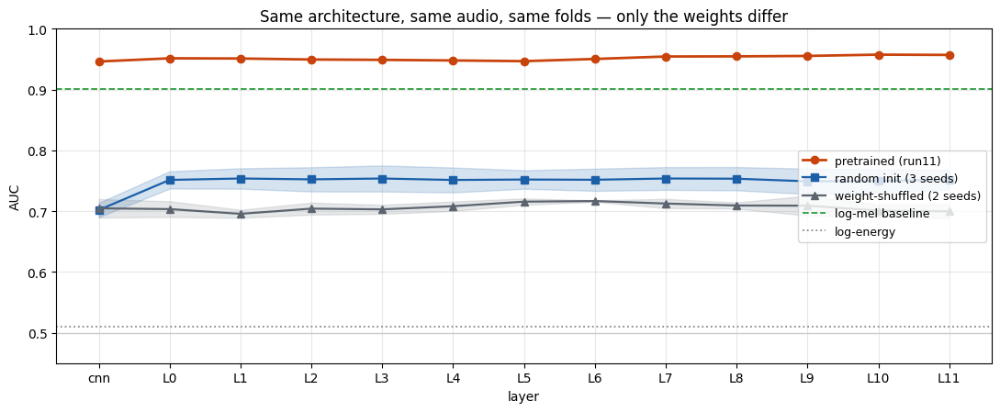

In [4]:
# --- the control, drawn ---
fig, ax = plt.subplots(figsize=(11, 4.6))
x = np.arange(len(tags))
pre  = [ctl["layer_table"][t]["pretrained"] for t in tags]
rnd  = np.array([ctl["layer_table"][t]["rand_mean"] for t in tags])
rsd  = np.array([ctl["layer_table"][t]["rand_sd"]   for t in tags])
shf  = np.array([ctl["layer_table"][t]["shuf_mean"] for t in tags])
ssd  = np.array([ctl["layer_table"][t]["shuf_sd"]   for t in tags])

ax.plot(x, pre, "o-", color="#c9430c", lw=2, label="pretrained (run11)")
ax.plot(x, rnd, "s-", color="#1a5fa8", lw=1.6, label="random init (3 seeds)")
ax.fill_between(x, rnd-rsd, rnd+rsd, color="#1a5fa8", alpha=.18)
ax.plot(x, shf, "^-", color="#5c646f", lw=1.6, label="weight-shuffled (2 seeds)")
ax.fill_between(x, shf-ssd, shf+ssd, color="#5c646f", alpha=.15)
ax.axhline(ctl["baselines"]["logmel"],    ls="--", color="#2a9d3f", lw=1.3, label="log-mel baseline")
ax.axhline(ctl["baselines"]["logenergy"], ls=":",  color="#888",    lw=1.3, label="log-energy")
ax.axhline(0.5, ls="-", color="#ccc", lw=1)
ax.set_xticks(x); ax.set_xticklabels(tags)
ax.set_xlabel("layer"); ax.set_ylabel("AUC")
ax.set_title("Same architecture, same audio, same folds — only the weights differ")
ax.legend(fontsize=9, loc="center right"); ax.grid(alpha=.3); ax.set_ylim(0.45, 1.0)
plt.tight_layout(); plt.show()

### What the picture says

Three readings, in order of how much they change the story:

1. **Pretraining does the work.** A random HuBERT reaches ~0.75 — far above energy (0.51), so an
   untrained network posted as a result would look convincing. But it sits *below* plain log-mel
   (0.90). The architecture alone is not the story.
2. **Most of the learning is in the convolutional front end.** The pretrained CNN is already at
   0.946, and twelve pretrained transformer blocks add about **+0.011**. The random CNN is 0.702,
   and a random transformer adds ~+0.05 on top of it. This is why the layer sweep is a plateau —
   there is little left for the transformer to contribute once the CNN is trained.
3. **Shuffled is worse than fresh-random** and gains nothing with depth: trained weight
   distributions make poor initialisations once the positions are scrambled.

## 2. Geometry of the space, layer by layer

Every number here is computed in the **full 768-d space**. UMAP appears later and is only ever
used for looking — never for measuring.

Watch `linear_auc` against `knn10_auc`: they disagree, and the disagreement is the finding.

In [5]:
viz = load("viz_report.json", VIZ)
g = viz["geometry"]
cols = [("linear_auc", "linear"), ("knn10_auc", "kNN-10"), ("silhouette_label", "silhouette"),
        ("ward_ami", "wardAMI"), ("pca_dim_90", "dim90"), ("pc0_var", "PC0 var"),
        ("pc0_db_corr", "|r(PC0,dB)|")]
print(f"split: {viz['split']}\n")
print(f"{'layer':6s}" + "".join(f"{n:>12s}" for _, n in cols))
for k, v in g.items():
    row = f"{k:6s}"
    for key, _ in cols:
        row += f"{v[key]:12.3f}" if isinstance(v[key], float) else f"{v[key]:12d}"
    print(row)

split: contiguous 60s time blocks within 1 recording(s) (31 blocks) -- NOT a recording holdout

layer       linear      kNN-10  silhouette     wardAMI       dim90     PC0 var |r(PC0,dB)|
cnn          0.946       0.900       0.048       0.088          45       0.209       0.540
0            0.951       0.909       0.066       0.055          25       0.272       0.562
1            0.951       0.914       0.065       0.076          35       0.277       0.563
2            0.949       0.932       0.077       0.124          44       0.251       0.569
3            0.949       0.934       0.082       0.115          53       0.241       0.587
4            0.948       0.936       0.083       0.166          59       0.225       0.594
5            0.947       0.936       0.082       0.120          65       0.217       0.587
6            0.950       0.935       0.079       0.146          70       0.217       0.589
7            0.954       0.935       0.081       0.137          74       0.217       

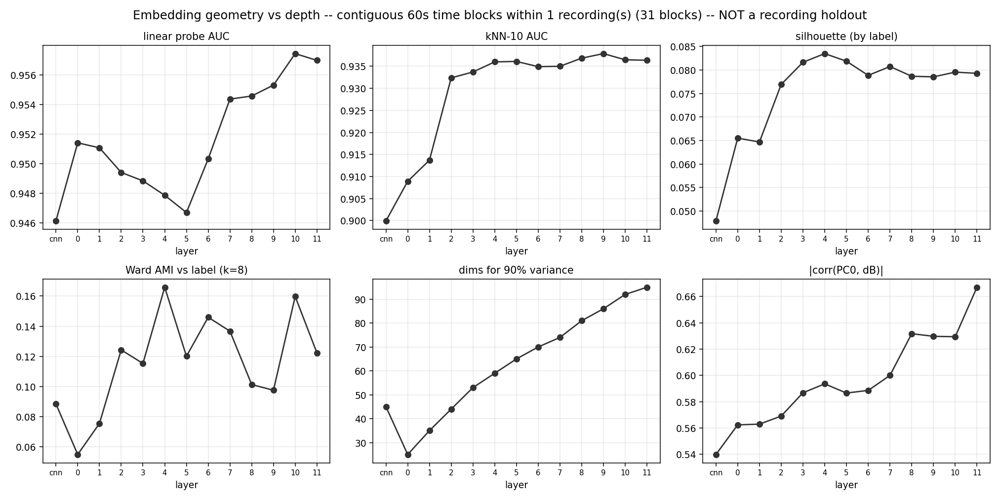

In [6]:
display(Image(str(VIZ / "03_layer_geometry.png")))

**The disagreement.** Linear AUC is flat with depth while **kNN-10 climbs 0.899 → 0.938**. Depth
is tightening *local* class structure that a straight hyperplane cannot exploit. That is also why
the layer sweep looked like a plateau: a linear probe was the wrong instrument for seeing what
depth was doing.

Two more: the representation spreads out (45 → 95 dimensions for 90% of variance), and
`|corr(PC0, dB)|` **rises** with depth, 0.54 → 0.67 — deeper layers are *more* loudness-aligned on
their leading axis, not less. Loudness never stops being the biggest single direction in this
space; the classifier just stops relying on it.

## 3. Layer-by-layer UMAP — interactive

Change the knobs, re-run. `VARIANT` accepts `pretrained`, `rand_seed0/1/2`,
`shuffled_seed0/1`; setting it to `rand_seed0` reproduces the untrained arm's blob for yourself.

First run takes ~20 s per panel (UMAP fits from scratch); embeddings are cached per
(variant, layer) so re-colouring is instant.

In [7]:
F = np.load(FEATS / "randinit_feats.npz", allow_pickle=True)
y, starts, en = F["y"], F["starts"], F["en"]
VARIANTS = [str(v) for v in F["variants"]]
print("variants:", VARIANTS)
print(f"{len(y)} windows, {y.mean()*100:.1f}% call, loudness {en.min():.0f} to {en.max():.0f} dB")

def layer_matrix(variant, layer):
    # layer: 'cnn' or 0..11
    return F[f"Xcnn_{variant}"] if layer == "cnn" else F[f"X_{variant}"][:, int(layer)]

_umap_cache = {}
def embed(variant, layer, seed=0):
    key = (variant, layer, seed)
    if key not in _umap_cache:
        import umap
        from sklearn.preprocessing import StandardScaler
        Z = StandardScaler().fit_transform(layer_matrix(variant, layer))
        _umap_cache[key] = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1,
                                     random_state=seed).fit_transform(Z)
    return _umap_cache[key]

variants: ['pretrained', 'rand_seed0', 'rand_seed1', 'rand_seed2', 'shuffled_seed0', 'shuffled_seed1']
1801 windows, 67.6% call, loudness -66 to -21 dB


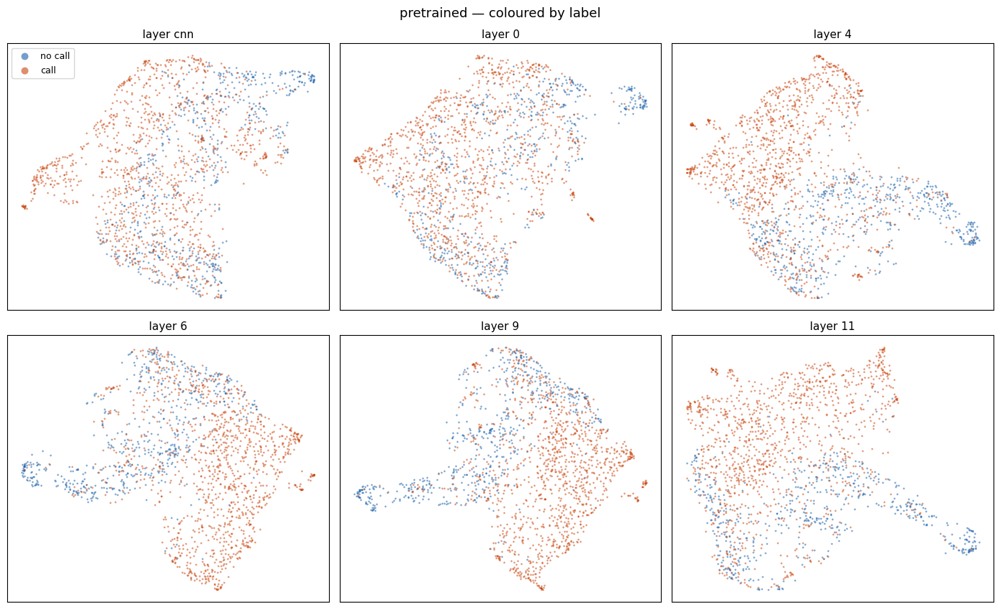

In [8]:
# --- knobs ---
VARIANT = "pretrained"          # pretrained | rand_seed0 | shuffled_seed0 | ...
LAYERS  = ["cnn", 0, 4, 6, 9, 11]
COLOR   = "label"               # label | loudness
# ------------

fig, axes = plt.subplots(2, 3, figsize=(14, 8.6))
for ax, L in zip(axes.ravel(), LAYERS):
    Z = embed(VARIANT, L)
    if COLOR == "label":
        for val, c, nm in [(0, "#1a5fa8", "no call"), (1, "#c9430c", "call")]:
            m = y == val
            ax.scatter(Z[m, 0], Z[m, 1], s=3.2, c=c, alpha=.6, linewidths=0, label=nm)
    else:
        s = ax.scatter(Z[:, 0], Z[:, 1], s=3.2, c=en, cmap="viridis", alpha=.75, linewidths=0)
        plt.colorbar(s, ax=ax, fraction=.046, label="dB")
    ax.set_title(f"layer {L}", fontsize=11); ax.set_xticks([]); ax.set_yticks([])
if COLOR == "label":
    axes[0, 0].legend(markerscale=4, fontsize=9)
fig.suptitle(f"{VARIANT} — coloured by {COLOR}", fontsize=13)
plt.tight_layout(); plt.show()

Run the cell above twice — once with `COLOR = "label"`, once with `COLOR = "loudness"`. If the two
pictures look alike, the probe could be reading loudness rather than call structure. They don't,
which is the visual form of the loudness-matched control: within a narrow dB band the model still
scores 0.963 while energy falls to 0.564.

Then set `VARIANT = "rand_seed0"` and compare. Same architecture, same audio, same UMAP settings.

## 4. What the space groups on its own

Ward clustering with the **labels withheld**, then the labels brought back only to score the
result. A cluster that comes out 99% call is a call detector the model found without being told
calls exist.

In [9]:
# --- knobs ---
K     = 8
LAYER = 6
# ------------
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_mutual_info_score, homogeneity_score

Zs = StandardScaler().fit_transform(layer_matrix("pretrained", LAYER))
cl = AgglomerativeClustering(n_clusters=K, linkage="ward").fit_predict(Zs)
print(f"layer {LAYER}, k={K}   AMI vs label {adjusted_mutual_info_score(y, cl):.3f}   "
      f"homogeneity {homogeneity_score(y, cl):.3f}\n")
print(f"{'cluster':9s}{'n':>6s}{'% call':>9s}{'median dB':>12s}")
for c in sorted(range(K), key=lambda c: -y[cl == c].mean()):
    m = cl == c
    print(f"c{c:<8d}{m.sum():6d}{y[m].mean()*100:8.1f}%{np.median(en[m]):12.1f}")

layer 6, k=8   AMI vs label 0.146   homogeneity 0.300

cluster       n   % call   median dB
c3          275    99.3%       -44.8
c0          314    97.8%       -52.6
c2          453    64.2%       -44.0
c6          266    63.5%       -44.4
c1          197    55.3%       -42.8
c7          110    36.4%       -51.3
c4          120    21.7%       -55.6
c5           66     3.0%       -63.3


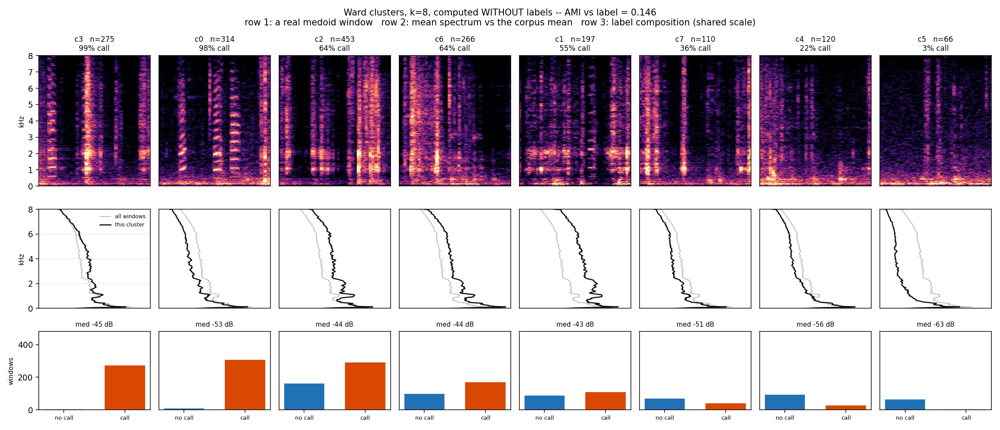

In [10]:
display(Image(str(VIZ / "04_cluster_spectrograms.png")))

Row 1 is a real **medoid** window, not an average. Averaging was the first thing I tried and it was
wrong: a zebra finch call is ~80 ms inside a 1 s window, so the mean of 40 windows smears every
call into broadband mush. Row 2 carries the spectral difference instead, as a profile against the
corpus mean. Row 3 shares one y-axis across all clusters — independently scaled bars made a
66-window cluster look the same size as a 453-window one.

## 5. Listen to it

Pick any window and get its spectrogram, its measured level, and a player. This is the cell to
reach for whenever a number looks surprising — the audio is the ground truth, everything else is
a summary of it.

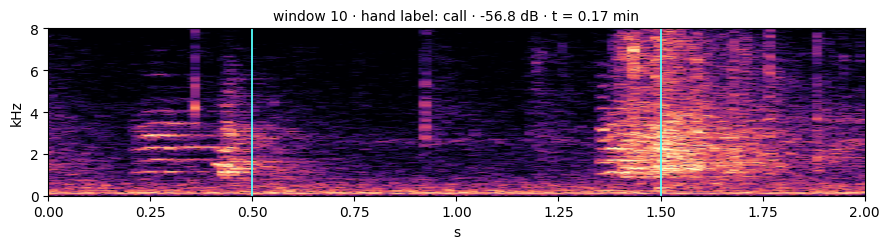

In [11]:
import soundfile as sf
from scipy.signal import spectrogram as _spec

_rec = None
def rec():
    global _rec
    if _rec is None:
        _rec, _sr = sf.read(AUDIO, dtype="float32")
        assert _sr == SR
    return _rec

def show_window(i, context=2.0, title=""):
    # Spectrogram + player for window i, inside `context` seconds either side, centred.
    r = rec()
    s = int(starts[i]); mid = s + WIN // 2; half = int(context * SR / 2)
    lo = max(0, mid - half); hi = min(len(r), lo + int(context * SR)); lo = max(0, hi - int(context * SR))
    seg = r[lo:hi]
    f, t, S = _spec(seg, SR, nperseg=512, noverlap=512-128, mode="psd")
    S = 10 * np.log10(S + 1e-12)
    fig, ax = plt.subplots(figsize=(9, 2.6))
    ax.imshow(S, origin="lower", aspect="auto", cmap="magma",
              extent=[0, len(seg)/SR, f[0]/1000, f[-1]/1000],
              vmin=np.percentile(S, 30), vmax=np.percentile(S, 99.7))
    for xv in ((s-lo)/SR, (s-lo+WIN)/SR):
        ax.axvline(xv, color="#5ff", lw=1.3)
    ax.set_ylim(0, 8); ax.set_ylabel("kHz"); ax.set_xlabel("s")
    lab = "call" if y[i] else "no call"
    ax.set_title(f"{title}window {i} · hand label: {lab} · {en[i]:.1f} dB · "
                 f"t = {s/SR/60:.2f} min", fontsize=10)
    plt.tight_layout(); plt.show()
    display(Audio(seg, rate=SR, normalize=True))   # normalised so quiet calls stay audible

# --- knobs ---
show_window(np.where(y == 1)[0][7])    # a labelled call

cluster c3: n=275, 99% call — three members:



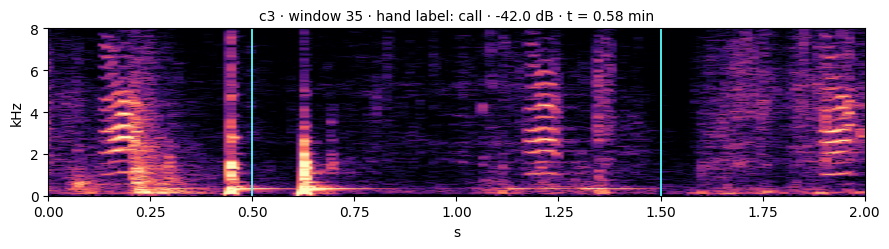

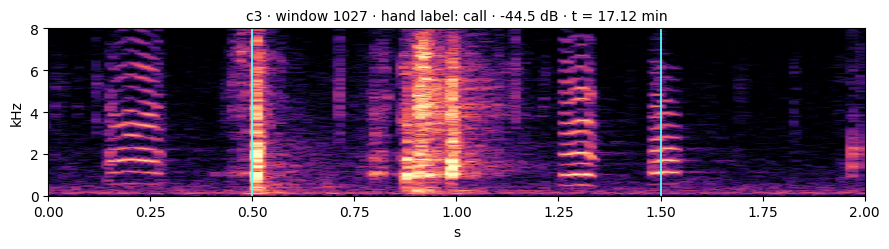

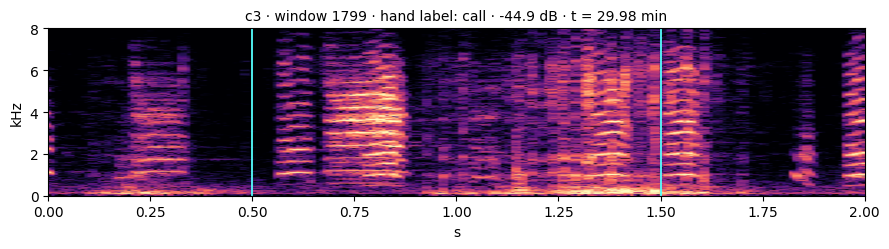

In [12]:
# The two purest clusters found without labels — listen to what the model grouped together.
pure = sorted(range(K), key=lambda c: -y[cl == c].mean())[0]
idx = np.where(cl == pure)[0]
print(f"cluster c{pure}: n={len(idx)}, {y[idx].mean()*100:.0f}% call — three members:\n")
for i in idx[np.linspace(0, len(idx)-1, 3).astype(int)]:
    show_window(i, title=f"c{pure} · ")

## 6. Where the errors are, and the 52 in dispute

`05_error_map.png` places every outcome in the representation. The high-confidence false
positives are ringed: windows the probe scored above 0.944 that the hand labels call noise.

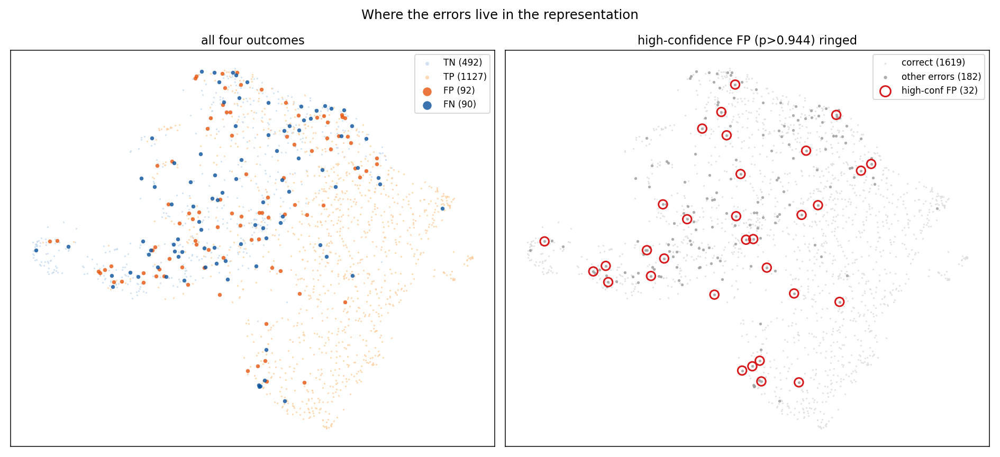

probe layer L10:  TP 1127  TN 492  FP 92  FN 90   of which high-confidence FP: 32


In [13]:
display(Image(str(VIZ / "05_error_map.png")))
e = viz["errors"]
print(f"probe layer {e['probe_layer']}:  TP {e['n_tp']}  TN {e['n_tn']}  "
      f"FP {e['n_fp']}  FN {e['n_fn']}   of which high-confidence FP: {e['n_high_conf_fp']}")

In [14]:
# The eval-B error inventory, and the two FP populations the acoustics split into.
pop = load("evalB_fp_two_populations.json")
if pop:
    for k in ("at_0p5", "at_0p944"):
        d = pop[k]
        print(f"{k}: n={d['n_fp']}  peak {d['peak_db']} dB  pitch {d['pitch']}  "
              f"flatness {d['flatness']}\n    {d['reading']}\n")
    print(f"reference TP: {pop['reference_TP']}\nreference TN: {pop['reference_TN']}")

at_0p5: n=169  peak -37.77 dB  pitch 0.378  flatness 0.22
    loud, broadband, NON-tonal -- transients (wing/cage/perch), genuine errors

at_0p944: n=52  peak -37.96 dB  pitch 0.425  flatness 0.122
    loud and TONAL; no measure separates them from true positives (flatness p=0.41, pitch p=0.25, peak dB p=0.13) -- consistent with unannotated calls, but n=52 so the test is underpowered; listening is what settles it

reference TP: {'peak_db': -40.77, 'pitch': 0.456, 'flatness': 0.111}
reference TN: {'peak_db': -41.95, 'pitch': 0.386, 'flatness': 0.162}


52 high-confidence false positives



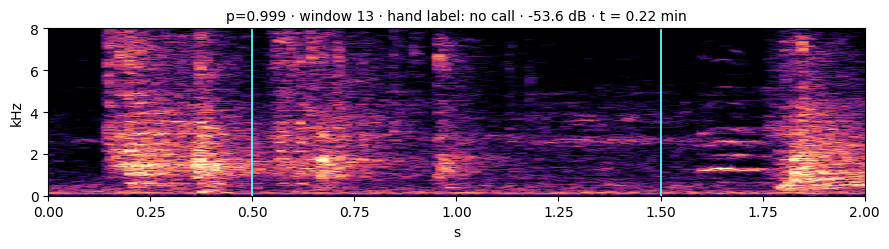

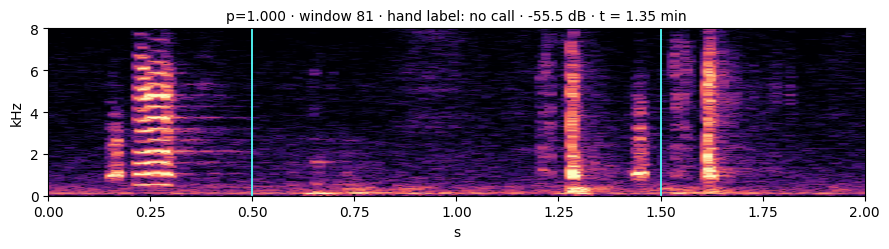

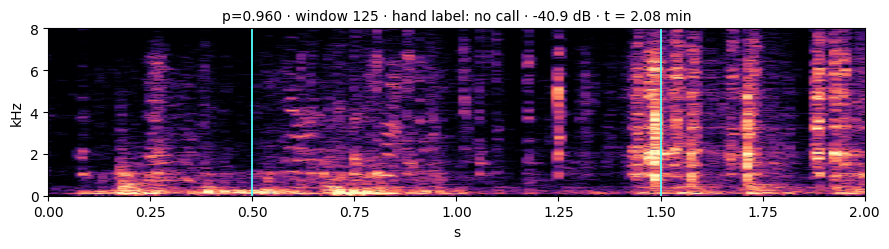

In [15]:
# Browse the disputed windows yourself. These are the 52 in the blind adjudication page.
E = np.load(FEATS / "evalB_err.npz", allow_pickle=True)
hi = np.where((E["outcome"].astype(str) == "FP") & (E["pb"] > 0.944))[0]
print(f"{len(hi)} high-confidence false positives\n")

# --- knobs ---
for i in hi[:3]:
    show_window(int(i), title=f"p={E['pb'][i]:.3f} · ")

**A caution about judging these here.** In this notebook you can see the label and the model's
score before you listen, which is exactly the bias the blind page exists to remove. Use these
cells to get a feel for the material; use the adjudication artifact to actually decide, where all
88 clips are unlabelled and loudness-matched controls are mixed in.

Score it afterwards with:

```
zfeval/experiments/score_adjudication.py --verdicts <exported.json>
```

## 9. Temporal resolution: what happens as the analysis segment shrinks

Enabled by the 2540 SoundSep intervals, which let a segment of **any** length be labelled exactly
rather than being stuck with the 1 s hand labels.

First, a clarification the sweep forced. At 1 s the label definition dominates everything:

| question asked of a 1 s window | AUC | log-mel |
|---|---|---|
| "does **any** call overlap this window" | 0.951 | 0.900 |
| "is the window's **centre** inside a call" | 0.767 | 0.751 |

A 1 s window holds roughly 1.5 calls somewhere, so presence is nearly free and localisation is
not. The reported 0.95 answers the first question. Everything below uses the **centre** label,
whose prevalence stays near 0.12 at every segment length — which is what makes the rows
comparable.

In [16]:
RS = load("resolution_sweep.json")
FB = load("frame_baselines.json")
sizes = sorted([int(k[1:]) for k in RS if k.startswith("w")], reverse=True)
print(f"{'segment':>9s}{'windowed':>11s}{'continuous':>12s}{'log-mel':>10s}{'energy':>9s}"
      f"{'context':>10s}{'prev':>8s}")
for sz in sizes:
    r = RS[f"w{sz}"]["center"]
    bw = max(r["windowed_L0"], r["windowed_L6"])
    bc = max(r["continuous_L0"], r["continuous_L6"])
    print(f"{sz:7d}ms{bw:11.4f}{bc:12.4f}{r['logmel']:10.4f}{r['logenergy']:9.4f}"
          f"{r['context_benefit']:+10.4f}{r['prevalence']:8.3f}")
f = FB["full"]
print(f"{'20ms frm':>9s}{'--':>11s}{max(f['hubert_L0']['auc'], f['hubert_L6']['auc']):12.4f}"
      f"{f['logmel_100ms']['auc']:10.4f}{f['logenergy']['auc']:9.4f}{'':10s}{FB['prevalence']:8.3f}")
print(f"\nframe level, AP (the honest metric at 12% prevalence):")
print(f"  HuBERT L0 {f['hubert_L0']['ap']:.4f}   log-mel(100ms) {f['logmel_100ms']['ap']:.4f}   "
      f"energy {f['logenergy']['ap']:.4f}")
print(f"\nsample-size control -- the 20 ms row trains on 90,061 frames, the windowed rows on 6,000:")
m = FB["matched"]
print(f"  20 ms subsampled to 6,000:  L0 {m['hubert_L0']['auc']:.4f}  "
      f"(vs {f['hubert_L0']['auc']:.4f} on all frames)")

  segment   windowed  continuous   log-mel   energy   context    prev
   1000ms     0.7666      0.6725    0.7513   0.5839   -0.0941   0.128
    500ms     0.8911      0.8125    0.8146   0.5932   -0.0786   0.125
    250ms     0.9456      0.9067    0.8947   0.6774   -0.0389   0.124
    125ms     0.9508      0.9491    0.9352   0.7195   -0.0017   0.126
     80ms     0.9245      0.9436    0.9397   0.7673   +0.0190   0.119
     40ms     0.9030      0.9257    0.9148   0.7775   +0.0227   0.123
 20ms frm         --      0.9687    0.9467   0.7837             0.124

frame level, AP (the honest metric at 12% prevalence):
  HuBERT L0 0.8681   log-mel(100ms) 0.7997   energy 0.2782

sample-size control -- the 20 ms row trains on 90,061 frames, the windowed rows on 6,000:
  20 ms subsampled to 6,000:  L0 0.9493  (vs 0.9687 on all frames)


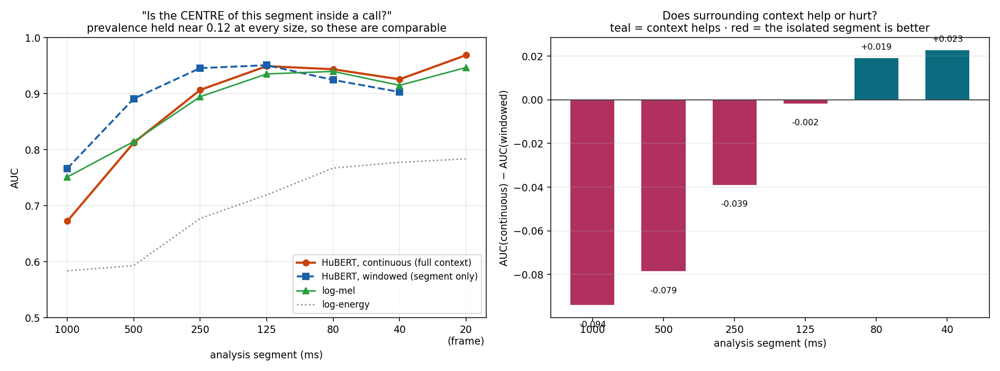

In [17]:
display(Image(str(VIZ / "08_resolution_sweep.png")))

**Two findings.**

**Context crossover at ~125 ms.** Above it, restricting the encoder to the segment is *better*
(−0.094 at 1 s). Below it, full context wins (+0.023 at 40 ms). At 40 ms an isolated clip gives
the transformer two frames to attend over, which cripples it. So: never feed isolated short clips
— run the encoder over the recording and pool frames afterwards.

**Accuracy saturates around 125 ms.** At matched sample size the 20 ms and 125 ms arms are level.
Going finer buys temporal *precision*, not accuracy.

And the uncomfortable one: **log-mel is close on localisation.** On the centre question between
250 and 40 ms the two are within ~0.01. HuBERT's real advantage is presence detection, where the
frame-level AP gap is +0.068. Say "it detects better", not "it localises better".

## 10. Beating the 20 ms frame grid

HuBERT emits one frame every 320 samples, so an onset read off the grid carries ±10 ms of
quantisation before the model is even wrong. Three ways to do better, cheapest first — and the
cheapest wins.

In [18]:
SB = load("subframe_onset.json")
print(f"decoder (tuned once on the coarse arm, then held FIXED across arms): {SB['decoder']}")
print(f"grids: coarse {SB['grid_ms']['coarse']:.0f} ms, fine {SB['grid_ms']['fine']:.0f} ms "
      f"({SB['K']} shifted passes)\n")
print(f"{'arm':26s}{'n_pred':>8s}{'medErr':>9s}{'bias':>8s}{'F1@10':>8s}{'F1@20':>8s}{'F1@50':>8s}")
for nm, r in SB["arms"].items():
    print(f"{nm:26s}{r['n_pred']:8d}{r['med_abs_err_ms']:9.1f}{r['bias_ms']:+8.1f}"
          f"{r['F1_by_tol']['10ms']:8.3f}{r['F1_by_tol']['20ms']:8.3f}{r['F1_by_tol']['50ms']:8.3f}")

decoder (tuned once on the coarse arm, then held FIXED across arms): {'thr': 0.4, 'smooth': 1, 'min_dur': 0.02, 'merge_gap': 0.0}
grids: coarse 20 ms, fine 5 ms (4 shifted passes)

arm                         n_pred   medErr    bias   F1@10   F1@20   F1@50
coarse_nearest                2298     13.3   +10.6   0.313   0.576   0.809
coarse_interp                 2395      8.8    +1.7   0.455   0.683   0.831
shifted_K4_nearest            2354      8.6    +5.1   0.462   0.664   0.823
shifted_K4_interp             2405      7.8    +3.0   0.484   0.677   0.828


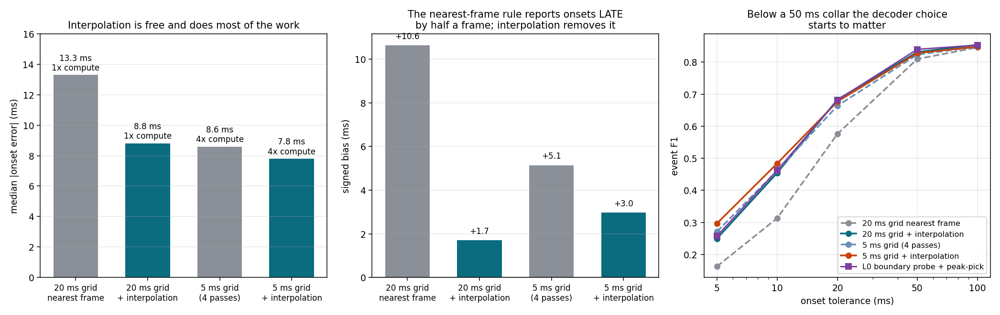

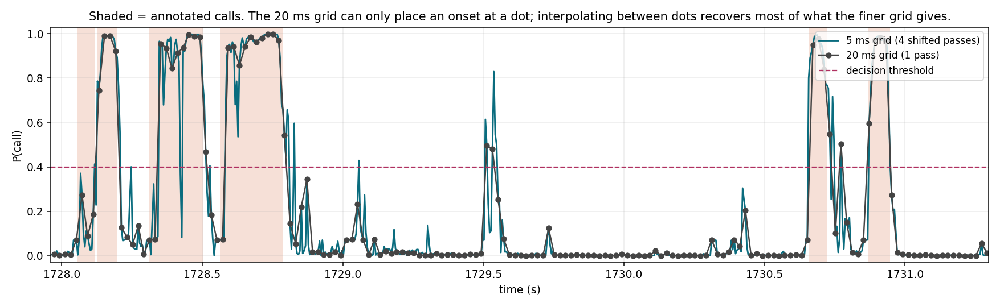

In [19]:
display(Image(str(VIZ / "09_onset_resolution.png")))
display(Image(str(VIZ / "10_probability_curve.png")))

**Take the interpolation, skip the extra passes.** Linearly interpolating the threshold crossing
between frames costs nothing, cuts median onset error 13.3 → 8.8 ms, and removes a systematic
**+10.6 ms late bias** — which is exactly half a frame, the signature of "report the first frame
past the threshold". Four shifted passes cost 4× the compute and land at 8.6 ms.

**The remaining ~8 ms is the encoder, not the grid.** A 5 ms grid should quantise to ~2.5 ms;
error stays at 7.8 ms. The 400-sample (25 ms) receptive field plus transformer smearing is the
floor. Sampling finer is not where the next gain is.

In [20]:
# A boundary-specialised probe: trained on "within +-1 frame of an onset" instead of
# "inside a call". A negative result, and a useful one.
OP = load("onset_probe.json")
print(f"boundary target prevalence {OP['boundary_prevalence']:.4f} "
      f"(+-{OP['halfwidth_frames']} frame)\n")
for L, d in OP["layers"].items():
    print(f"{L}: boundary probe AUC {d['boundary_frame_auc']:.4f}  AP {d['boundary_frame_ap']:.4f}")
    for nm, r in d["decoders"].items():
        print(f"   {nm:26s} med {r['med_abs_err_ms']:5.1f} ms  bias {r['bias_ms']:+5.1f}  "
              f"F1@10 {r['10ms']['F1']:.3f}  F1@20 {r['20ms']['F1']:.3f}  F1@50 {r['50ms']['F1']:.3f}")
    print()

boundary target prevalence 0.0831 (+-1 frame)

L0: boundary probe AUC 0.9549  AP 0.7260
   region_crossing_interp     med   9.1 ms  bias  -0.8  F1@10 0.455  F1@20 0.677  F1@50 0.843
   boundary_peak_parabolic    med   8.7 ms  bias  +0.5  F1@10 0.462  F1@20 0.682  F1@50 0.840
   boundary_peak_nearest      med  10.7 ms  bias  +0.2  F1@10 0.386  F1@20 0.645  F1@50 0.836

L6: boundary probe AUC 0.9332  AP 0.6434
   region_crossing_interp     med   8.8 ms  bias  +1.7  F1@10 0.455  F1@20 0.683  F1@50 0.831
   boundary_peak_parabolic    med  13.5 ms  bias  -1.0  F1@10 0.346  F1@20 0.605  F1@50 0.749
   boundary_peak_nearest      med  14.2 ms  bias  -2.1  F1@10 0.330  F1@20 0.590  F1@50 0.749



**The dedicated boundary probe is not worth it.** At L0 it edges the region probe (8.7 vs 9.1 ms,
F1@10 0.462 vs 0.455) by less than noise; at L6 it is clearly worse. What *does* matter is
sub-sample refinement: peak-picking without parabolic interpolation gives 10.7 ms, with it 8.7 ms —
the same lesson as interpolating the threshold crossing.

**L0 beats L6 for events as well as for frames** (F1@50 0.843 vs 0.831). Use layer 0 for both.

## 11. Recommendations

Ordered by payoff per unit of effort.

1. **Interpolate every threshold crossing.** Free, 34% lower onset error, and it removes a
   +10.6 ms systematic late bias that is currently in every onset the pipeline emits.
2. **Run the encoder continuously and pool frames afterwards; never classify isolated short
   clips.** Below 125 ms the isolated-clip regime loses up to 0.05 AUC for nothing.
3. **Use layer 0.** Best at frame detection (0.969 vs 0.960) and best at events (F1@50 0.843 vs
   0.831). It is also the cheapest layer to compute.
4. **Stop sampling finer than 20 ms.** The floor is the receptive field, not the grid.
5. **State which question a number answers.** "Any call in this window" and "is this instant
   voiced" differ by 0.18 AUC at 1 s.
6. **Where the next real gain is: the encoder's temporal acuity.** Every decoder-side trick is
   now exhausted at ~8 ms. Shortening the convolutional stride, or fine-tuning with a
   boundary-aware objective, is the only lever left — and it needs training, not post-processing.

## 12. Representational similarity between layers

Linear CKA between every pair of layers: 1.0 means the two layers carry the same geometry.

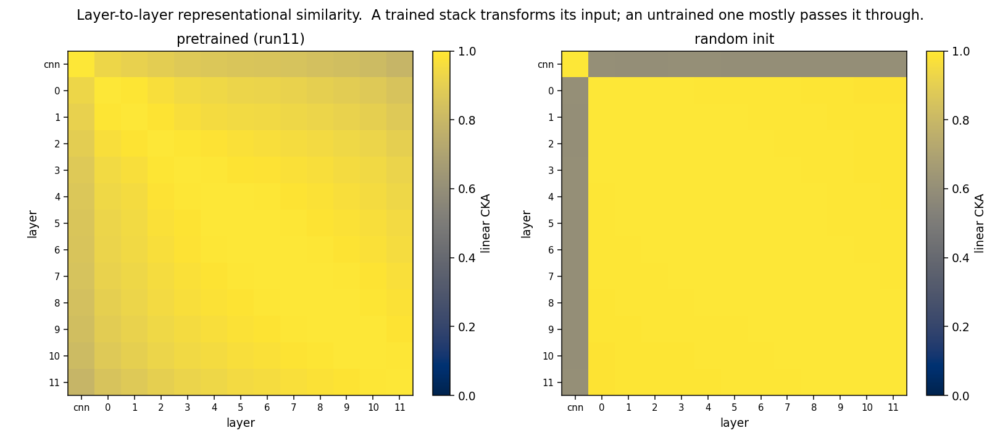

cnn -> L11 :  pretrained 0.792   random 0.602
L0  -> L11 :  pretrained 0.853   random 0.986


In [21]:
display(Image(str(VIZ / "07_layer_cka.png")))
M = {k: np.array(v) for k, v in viz["cka"].items()}
lab = ["cnn"] + [str(i) for i in range(12)]
print(f"cnn -> L11 :  pretrained {M['pretrained'][0, 12]:.3f}   random {M['random'][0, 12]:.3f}")
print(f"L0  -> L11 :  pretrained {M['pretrained'][1, 12]:.3f}   random {M['random'][1, 12]:.3f}")

An untrained stack has L0→L11 CKA of **0.986** — it barely changes its input as it goes up. The
trained one is at 0.85: its layers actually transform. That is the same fact the AUC table states,
seen without reference to any label.

**On the warnings.** numpy on Apple Accelerate emits spurious divide-by-zero / overflow
`RuntimeWarning`s from `matmul` here even though every input is finite and |x| < 16. Checked by
recomputing CKA in Gram space (`⟨K,L⟩/√(⟨K,K⟩⟨L,L⟩)`), which dispatches different BLAS shapes: the
two routes agree to 7e-16. The warnings are flags, not a corrupted result.

## 13. Every figure

All of these are written by `zfeval/experiments/embed_viz.py`.

**01_layer_umap_labels.png**

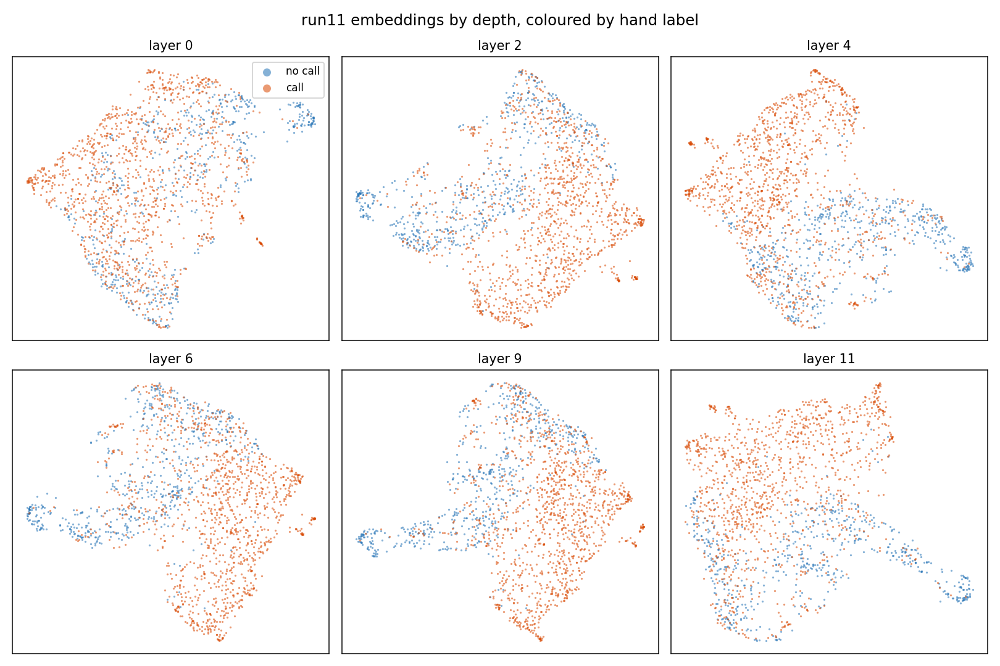

**02_layer_umap_loudness.png**

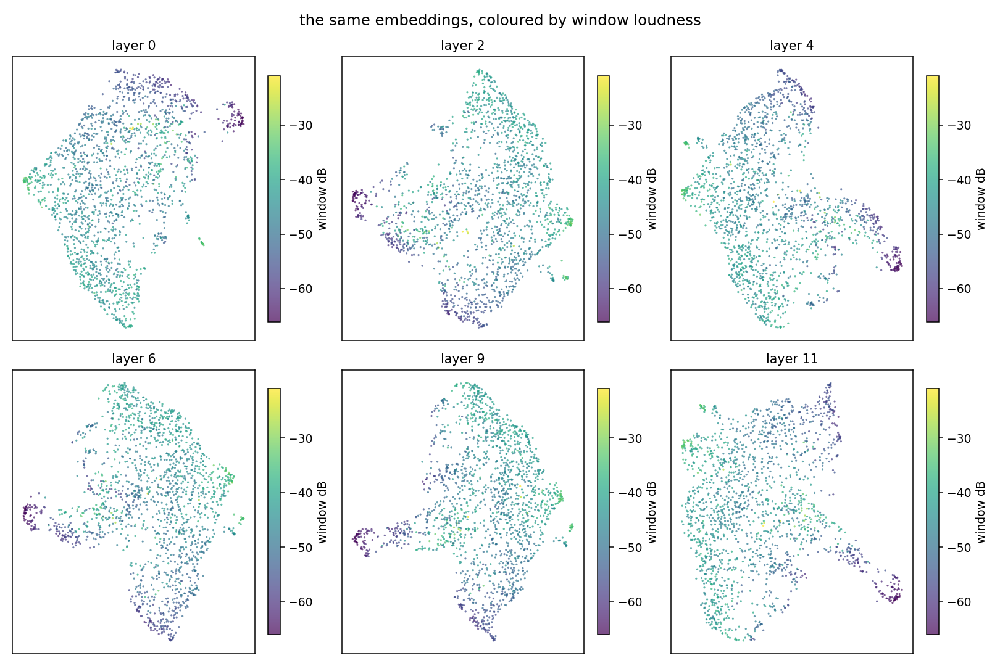

**03_layer_geometry.png**

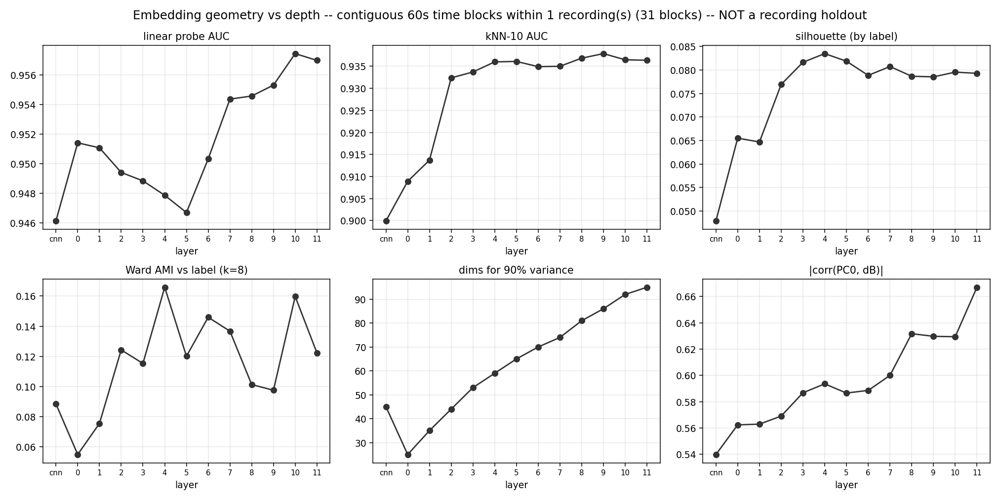

**04_cluster_spectrograms.png**

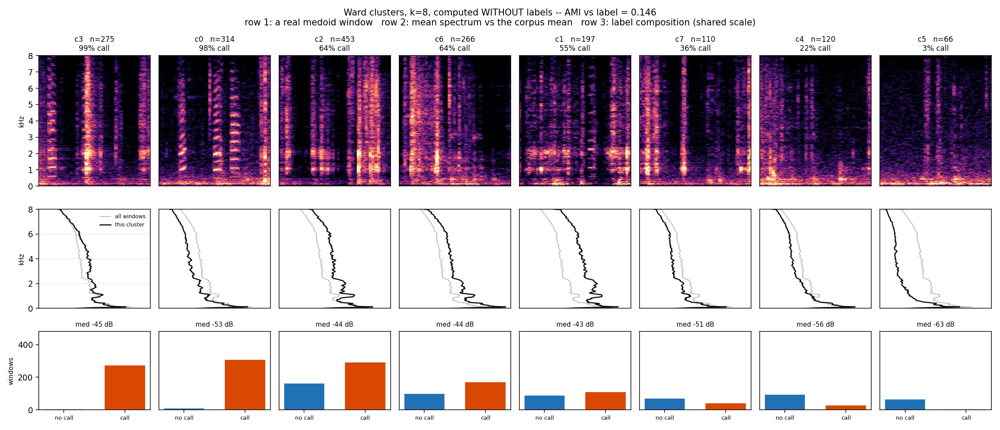

**05_error_map.png**

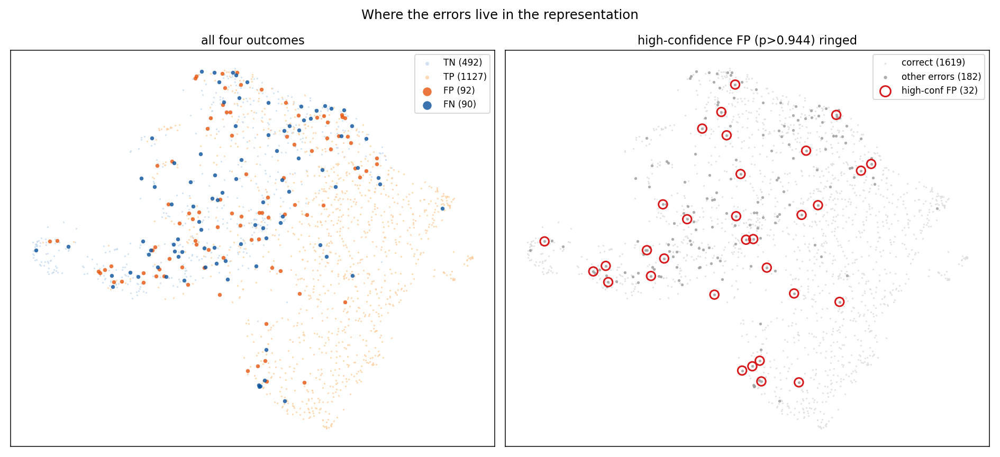

**06_trained_vs_random.png**

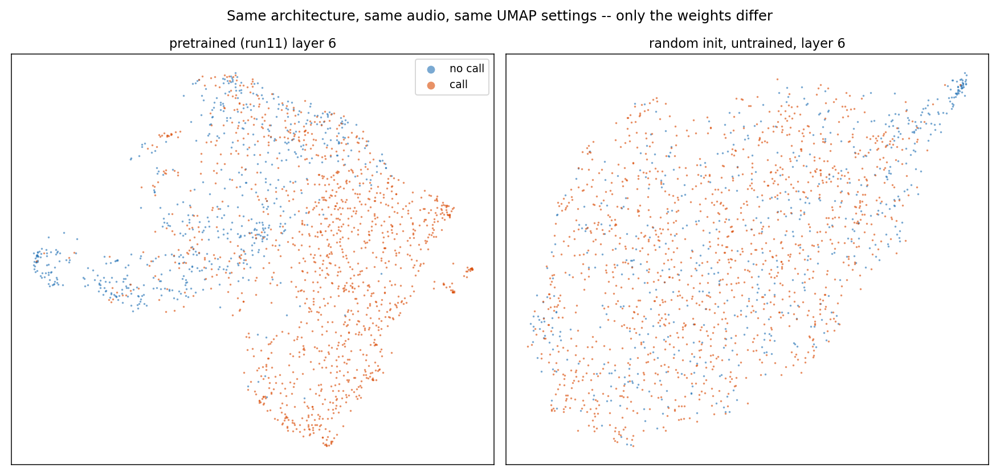

**07_layer_cka.png**

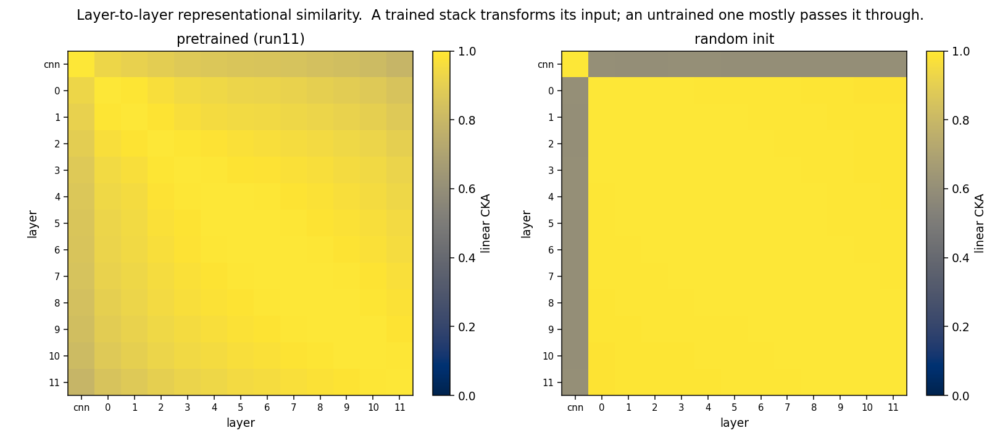

**08_resolution_sweep.png**

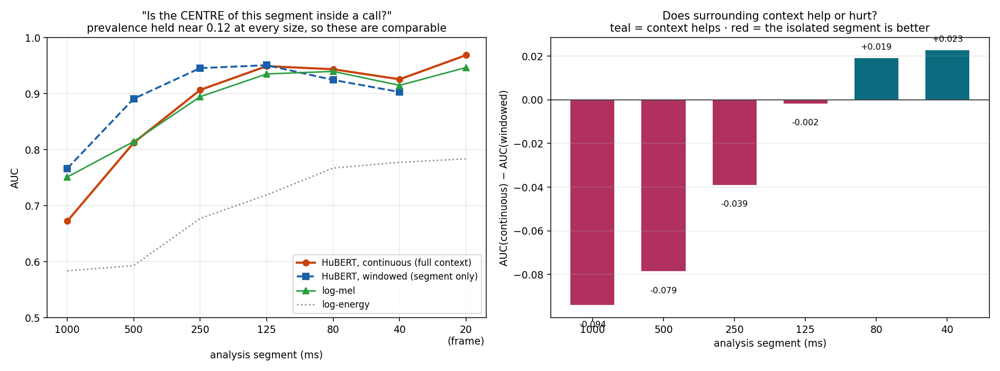

**09_onset_resolution.png**

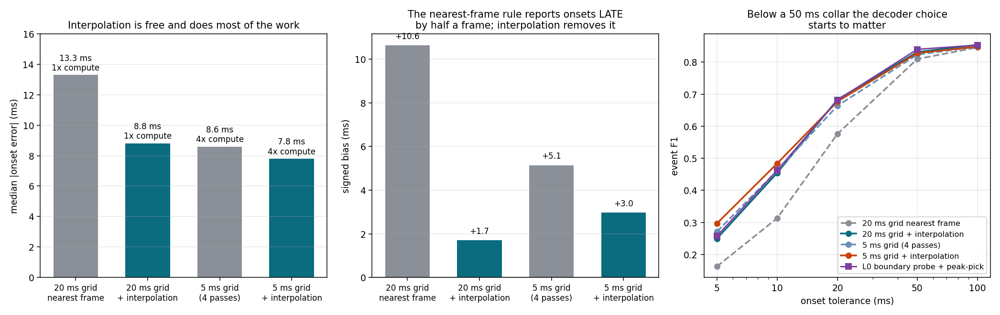

**10_probability_curve.png**

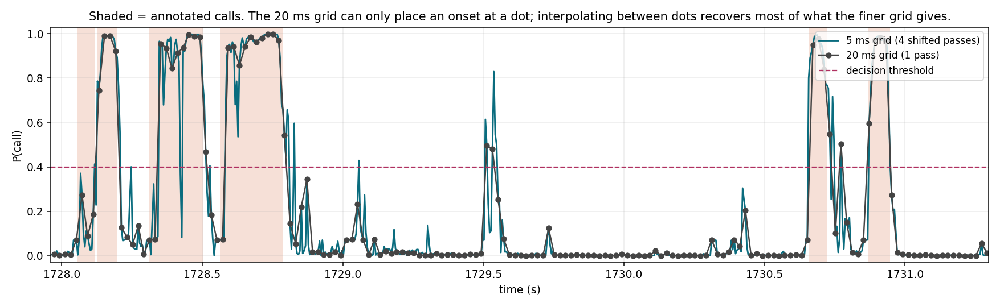

In [22]:
for p in sorted(VIZ.glob("*.png")):
    display(Markdown(f"**{p.name}**"))
    display(Image(str(p)))

## Rebuilding any of this

```bash
cd zfeval

# 1. extract features for every arm (~90 s per arm, CPU; needs the release weights + local audio)
python experiments/randinit_control.py --device cpu --seeds 0 1 2

# 2. score the control
python experiments/randinit_analyze.py

# 3. the figures
python experiments/embed_viz.py --k 8

# 4. rebuild the blind adjudication page
python experiments/build_adjudication.py
python experiments/web/render_adjudicate.py

# 5. rebuild this notebook
python ../notebooks/build_embeddings_notebook.py
```

`randinit_control.py` refuses to run if the local forward pass does not reproduce the
Savio-extracted features (worst-layer cosine must exceed 0.9999), so a broken local environment
fails loudly instead of quietly producing a plausible wrong number.

**What is still missing:** this is eval C — a within-recording block split on `111021-000`, the one
recording whose audio is local. The neg_pool arm (71 recordings) needs the audio on Savio before
the control can be repeated there.